## Libraries import + matplotlib preset


In [1]:
import os
import re   
import numpy as np
import pandas as pd

%matplotlib inline
import matplotlib.pyplot as plt
# pixel in inches for figsize
px = 1/plt.rcParams['figure.dpi']
# default figsize for all figures
plt.rcParams['figure.figsize'] = [800*px, 600*px]

## Crate paths for csv files


In [2]:
CURR_DIR = os.getcwd()
print(CURR_DIR)
data_path = os.path.join(CURR_DIR, 'datasets/Sleeve-textured.csv')

/Users/wszczawinski/Projects/master-thesis/analyses


## Create dataframe from .cvs


In [3]:
df = pd.read_csv(data_path, sep=';', decimal=',')

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99767 entries, 0 to 99766
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Number In Batch  99767 non-null  int64  
 1   Count            99767 non-null  int64  
 2   Time (ms)        99767 non-null  int64  
 3   Timestamp        99767 non-null  object 
 4   Trigger          99767 non-null  object 
 5   obl X            99767 non-null  object 
 6   obl Y            99767 non-null  object 
 7   Odczyt Z         99767 non-null  float64
 8   Odczyt otwor     99767 non-null  object 
 9   Odczyt wal       99767 non-null  object 
 10  Kat obrotu       99767 non-null  float64
dtypes: float64(2), int64(3), object(6)
memory usage: 8.4+ MB


## Dropping not relevant columns


In [4]:
df = df.drop(['Number In Batch', 'Time (ms)', 'Timestamp', 'Trigger'], axis = 1)

df


,Count,obl X,obl Y,Odczyt Z,Odczyt otwor,Odczyt wal,Kat obrotu
0,1,"0,2654","0,0000",-37.206,"0,2654",Under Range,0.00
1,2,"0,2654","0,0000",-37.206,"0,2654",Under Range,0.00
2,3,"0,2654","0,0000",-37.206,"0,2654",Under Range,0.00
3,4,"0,2654","0,0000",-37.206,"0,2654",Under Range,0.00
4,5,"0,2654","0,0000",-37.206,"0,2654",Under Range,0.00
...,...,...,...,...,...,...,...
99762,99763,"0,2718","-0,0029",0.070,"0,2718",Under Range,-0.61
99763,99764,"0,2718","-0,0029",0.070,"0,2718",Under Range,-0.61
99764,99765,"0,2718","-0,0029",0.070,"0,2718",Under Range,-0.61
99765,99766,"0,2718","-0,0029",0.070,"0,2718",Under Range,-0.61


## Removing rows with measurments over and under range of the sensor


In [5]:
for col in ['obl X', 'obl Y']:
    df = df[df[col].str.contains("Over Range")==False]
    df = df[df[col].str.contains("Under Range")==False]
    df[col] = pd.to_numeric(df[col].apply(lambda x: re.sub(',', '.', str(x))))

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 96275 entries, 0 to 99766
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Count         96275 non-null  int64  
 1   obl X         96275 non-null  float64
 2   obl Y         96275 non-null  float64
 3   Odczyt Z      96275 non-null  float64
 4   Odczyt otwor  96275 non-null  object 
 5   Odczyt wal    96275 non-null  object 
 6   Kat obrotu    96275 non-null  float64
dtypes: float64(4), int64(1), object(2)
memory usage: 5.9+ MB


## Data exploration


In [6]:
df.head(1500)

,Count,obl X,obl Y,Odczyt Z,Odczyt otwor,Odczyt wal,Kat obrotu
0,1,0.2654,0.0000,-37.206,"0,2654",Under Range,0.00
1,2,0.2654,0.0000,-37.206,"0,2654",Under Range,0.00
2,3,0.2654,0.0000,-37.206,"0,2654",Under Range,0.00
3,4,0.2654,0.0000,-37.206,"0,2654",Under Range,0.00
4,5,0.2654,0.0000,-37.206,"0,2654",Under Range,0.00
...,...,...,...,...,...,...,...
1560,1561,-0.2677,-0.1025,-37.068,"0,2867",Under Range,-159.05
1561,1562,-0.2674,-0.1045,-37.068,"0,2871",Under Range,-158.65
1562,1563,-0.2664,-0.1065,-37.068,"0,2869",Under Range,-158.22
1563,1564,-0.2660,-0.1086,-37.068,"0,2873",Under Range,-157.79


In [7]:
df.describe()

,Count,obl X,obl Y,Odczyt Z,Kat obrotu
count,96275.000000,96275.000000,96275.000000,96275.000000,96275.000000
mean,49973.638525,0.001553,-0.014688,-18.605600,-170.870886
std,28859.936092,0.204323,0.187184,10.970766,108.826376
min,1.000000,-0.354200,-0.592600,-37.206000,-351.580000
25%,24961.500000,-0.198300,-0.190900,-28.316000,-261.430000
50%,49998.000000,0.000800,-0.020600,-18.482000,-168.480000
75%,75012.500000,0.220300,0.153800,-9.022000,-75.170000
max,99767.000000,0.277300,0.295100,0.070000,0.000000


In [8]:
df.corr()

,Count,obl X,obl Y,Odczyt Z,Kat obrotu
Count,1.000000,0.016075,-0.004866,0.999955,0.000225
obl X,0.016075,1.000000,-0.037820,0.016276,0.108074
obl Y,-0.004866,-0.037820,1.000000,-0.004794,-0.659976
Odczyt Z,0.999955,0.016276,-0.004794,1.000000,0.000203
Kat obrotu,0.000225,0.108074,-0.659976,0.000203,1.000000


### Single arrays from columns for ploting purposes


In [9]:
x = df['obl X']
y = df['obl Y']
z = df['Odczyt Z']
hole = df['Odczyt otwor']
shaft = df['Odczyt wal']
angle = df['Kat obrotu']
count = df['Count']

### Correlation between X and angle


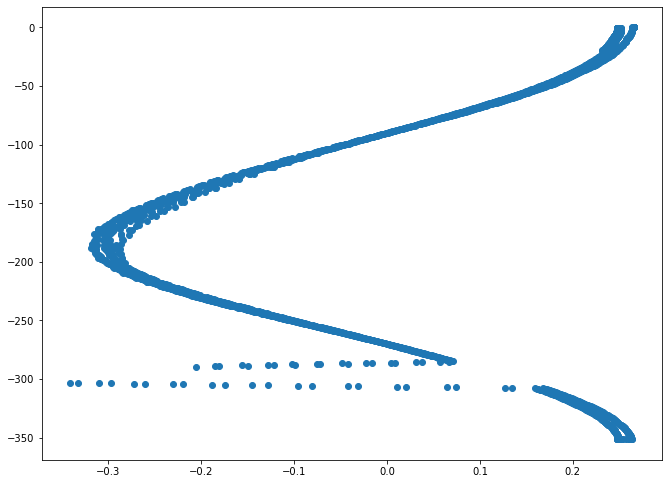

In [10]:
angles = angle[:2000]
xs = x[:2000]
plt.scatter(xs, angles)
plt.show()

array([[<AxesSubplot:title={'center':'Count'}>,
        <AxesSubplot:title={'center':'obl X'}>],
       [<AxesSubplot:title={'center':'obl Y'}>,
        <AxesSubplot:title={'center':'Odczyt Z'}>],
       [<AxesSubplot:title={'center':'Kat obrotu'}>, <AxesSubplot:>]],
      dtype=object)

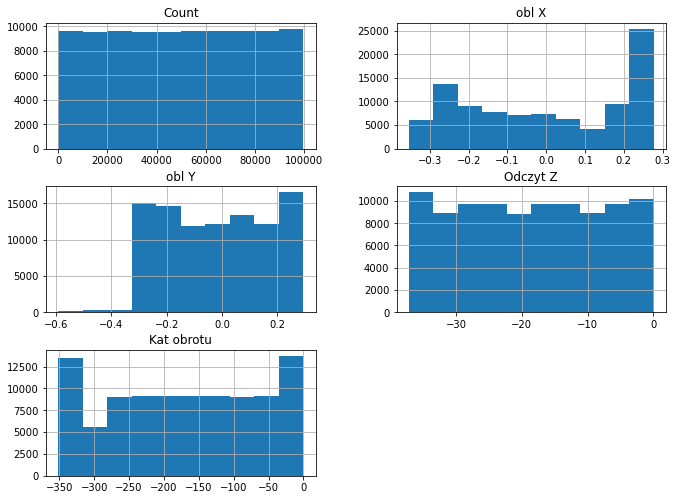

In [11]:
df.hist()

<AxesSubplot:>

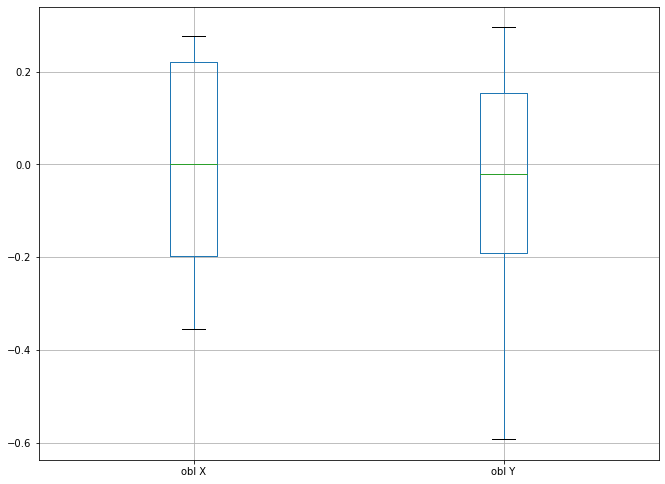

In [12]:
df.boxplot(column=['obl X', 'obl Y'])

Maximum angle value: 
0.0
Minimum angle value: 
-351.58


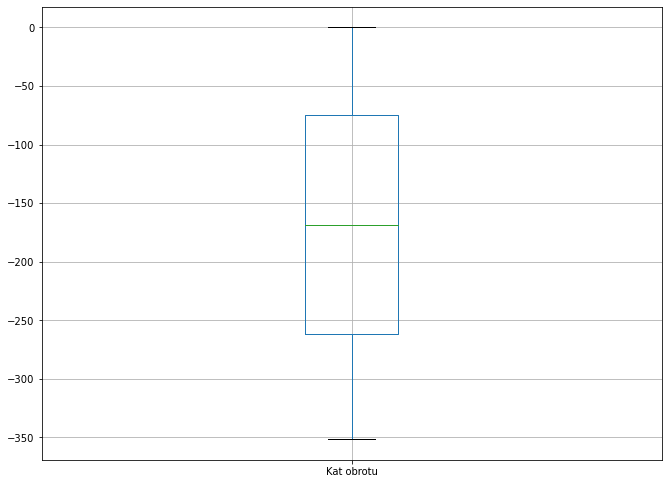

In [13]:
df.boxplot(column=['Kat obrotu'])
print('Maximum angle value: ')
print(df['Kat obrotu'].max())
print('Minimum angle value: ')
print(df['Kat obrotu'].min())

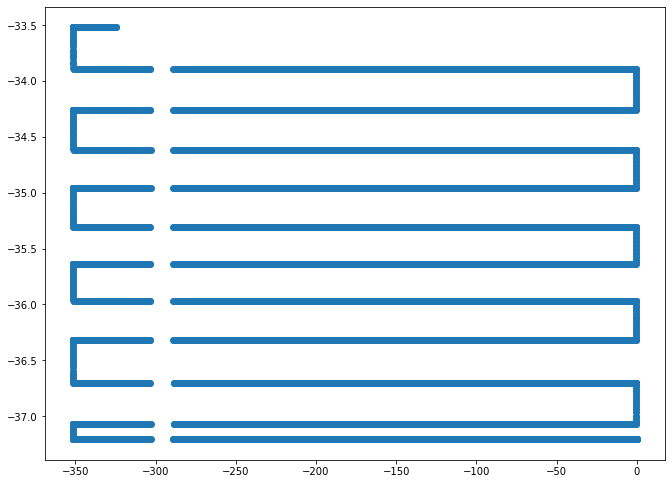

In [14]:

angles = angle[:10000]
zs = z[:10000]
cs = count[:2000]


plt.scatter(angles, zs)
plt.show()

## 3D plotting whole dataset

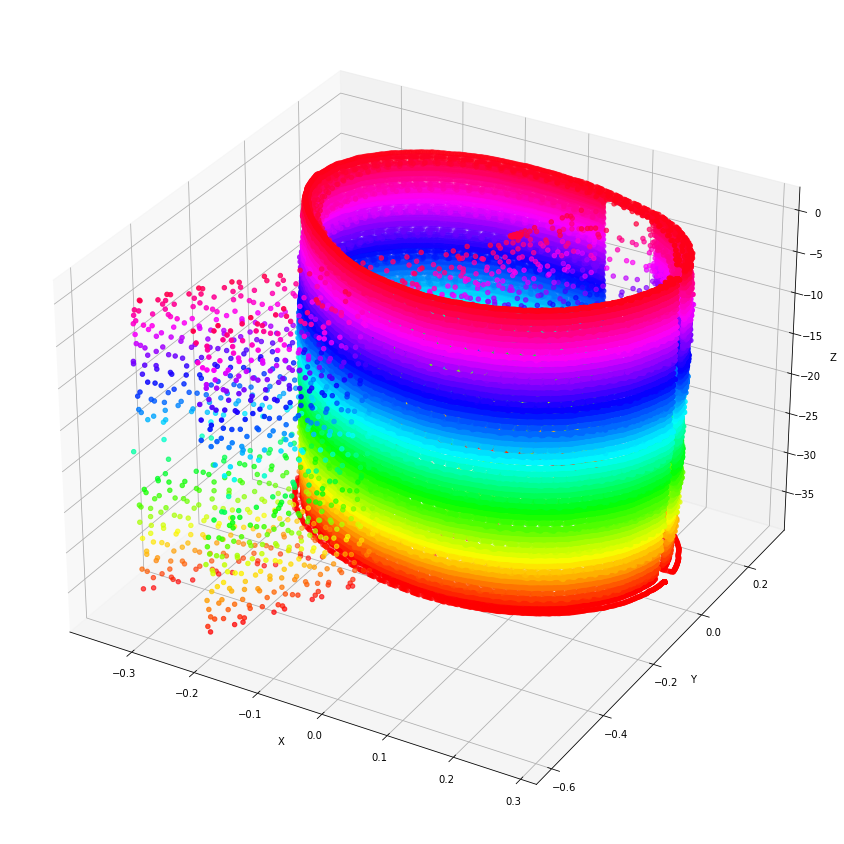

In [15]:
plt.figure(figsize=(1100*px, 1100*px))
ax = plt.axes(projection ='3d')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.scatter3D(x, y, z, c=z, cmap='hsv')

plt.show()

## Reduce dataset through cutting outliers on Z-axis

In [16]:
xs = x[1500: 90000]
ys = y[1500: 90000]
zs = z[1500: 90000]

In [17]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Scatter3d(
    x=xs, 
    y=ys, 
    z=zs, 
    # mode='markers',
    marker=dict(
        size=2,
        color=z,  # set color to an array/list of desired values
        colorscale='Viridis',   # choose a colorscale
        opacity=0.8,
    ),
)])

fig.update_layout(
    autosize=False,
    width=1000,
    height=1000,)
fig.show()

### Finding best fitting cylinder to data


In [18]:
from cylinder_fitting import fit

xx = xs.to_numpy()
yy = ys.to_numpy()
zz = zs.to_numpy()

points = np.array([xx,yy,zz]) 


points = np.transpose(points)

w_fit, C_fit, r_fit, fit_err = fit(points)

In [19]:
print("Center point: ", C_fit) 
print("Radius: ", r_fit) 
print("Vector: ", w_fit) 

Center point:  [-1.96202057e-02 -2.91862735e-03 -1.95475658e+01]
Radius:  0.2781819709994112
Vector:  [-3.45049172e-04  4.02979069e-04 -9.99999859e-01]


## Calculating cylinder surface based on center, radius and vector

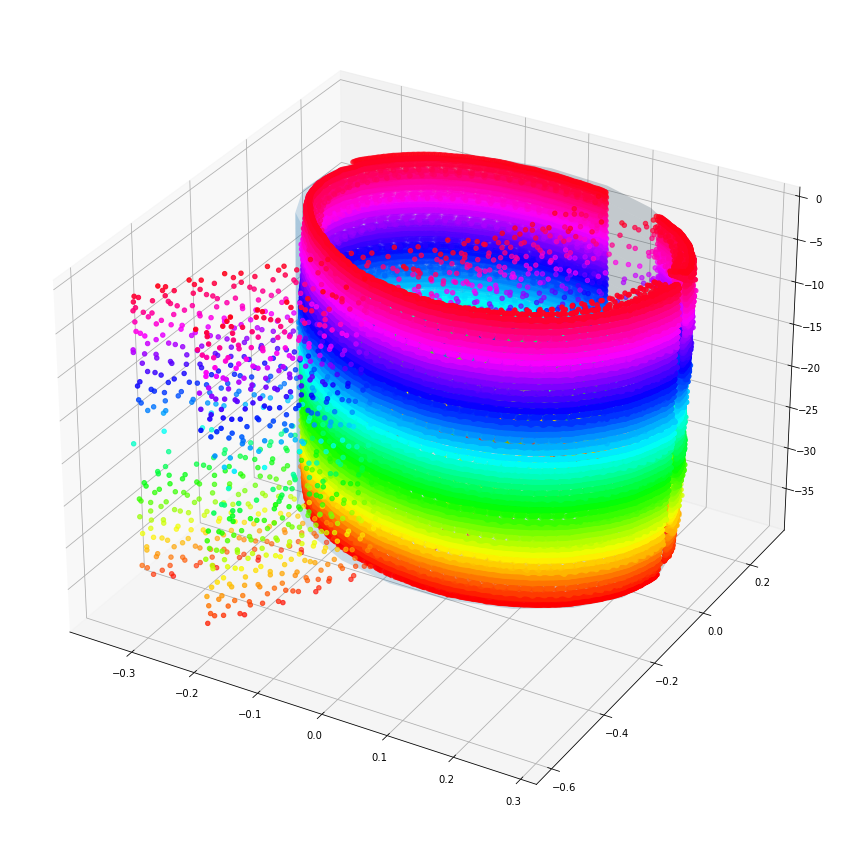

In [20]:
def rotation_matrix_from_axis_and_angle(u, theta):
    '''Calculate a rotation matrix from an axis and an angle.'''
    
    x = u[0]
    y = u[1]
    z = u[2]
    s = np.sin(theta)
    c = np.cos(theta)
    
    return np.array([[c + x**2 * (1 - c), x * y * (1 - c) - z * s, x * z * (1 - c) + y * s],
                     [y * x * (1 - c) + z * s, c + y**2 * (1 - c), y * z * (1 - c) - x * s ],
                     [z * x * (1 - c) - y * s, z * y * (1 - c) + x * s, c + z**2 * (1 - c) ]])

# Get the transformation matrix

theta = np.arccos(np.dot(w_fit, np.array([0, 0, 1])))
phi = np.arctan2(w_fit[1], w_fit[0])

M = np.dot(rotation_matrix_from_axis_and_angle(np.array([0, 0, 1]), phi),
               rotation_matrix_from_axis_and_angle(np.array([0, 1, 0]), theta))


   
delta = np.linspace(-np.pi, np.pi, 20)
z = np.linspace(-18, 18, 20)


Delta, Z = np.meshgrid(delta, z)
X = r_fit * np.cos(Delta)
Y = r_fit * np.sin(Delta)

for i in range(len(X)):
    for j in range(len(X[i])):
        p = np.dot(M, np.array([X[i][j], Y[i][j], Z[i][j]])) + C_fit

        X[i][j] = p[0]
        Y[i][j] = p[1]
        Z[i][j] = p[2]

# Plot the cylinder surface
%matplotlib inline
import matplotlib.pyplot as plt
plt.figure(figsize=(1100*px, 1100*px))
ax = plt.axes(projection ='3d')
ax.scatter3D(xs, ys, zs, c=zs, cmap='hsv')

ax.plot_surface(X, Y, Z, alpha=0.2)

plt.show()

## Vizualization of cylinder and measurment points

In [21]:
scPoints=go.Scatter3d(
    x=xs, 
    y=ys, 
    z=zs, 
    # mode='markers',
    marker=dict(
        size=2,
        color=z,  # set color to an array/list of desired values
        colorscale='Viridis',   # choose a colorscale
        opacity=0.8,
    ),
)

cyl2 = go.Surface(x=X, y=Y, z=Z,
                 showscale=False,
                 opacity=0.7)

fig =  go.Figure(data=[cyl2, scPoints])

fig.update_layout(
    autosize=False,
    width=1000,
    height=1000,)

fig.show()
fig.write_html('graph.html')


# import dash
# import dash_core_components as dcc
# import dash_html_components as html

# app = dash.Dash()
# app.layout = html.Div([
#     dcc.Graph(figure=fig)
# ])

# app.run_server(debug=True, use_reloader=False)  # Turn off reloader if inside Jupyter

## Cylinder fitting based on Pyransac

In [20]:
# import pyransac3d as pyrsc 

# xx = xs.to_numpy()
# yy = ys.to_numpy()
# zz = zs.to_numpy()

# points = np.array([xx,yy,zz]) 
# points = np.transpose(points)

# cylinder = pyrsc.Cylinder()
# center, axis, radius, inliers = cylinder.fit(np.array(points), thresh=0.1, maxIteration=100)

## Different function for cylinder ploting purposes

In [53]:
def data_for_cylinder_along_z(center_x, center_y, center_z, radius, height_z):
    '''
    Data for cylinder ploting based on center point, radius, height
    '''
    z = np.linspace(center_z, center_z + height_z, 50)
    theta = np.linspace(0, 2 * np.pi, 50)
    theta_grid, z_grid = np.meshgrid(theta, z)
    x_grid = radius * np.cos(theta_grid) + center_x
    y_grid = radius * np.sin(theta_grid) + center_y
    return x_grid, y_grid, z_grid

In [54]:

Xc, Yc, Zc = data_for_cylinder_along_z(C_fit[0], C_fit[1], C_fit[2], r_fit, 2) 

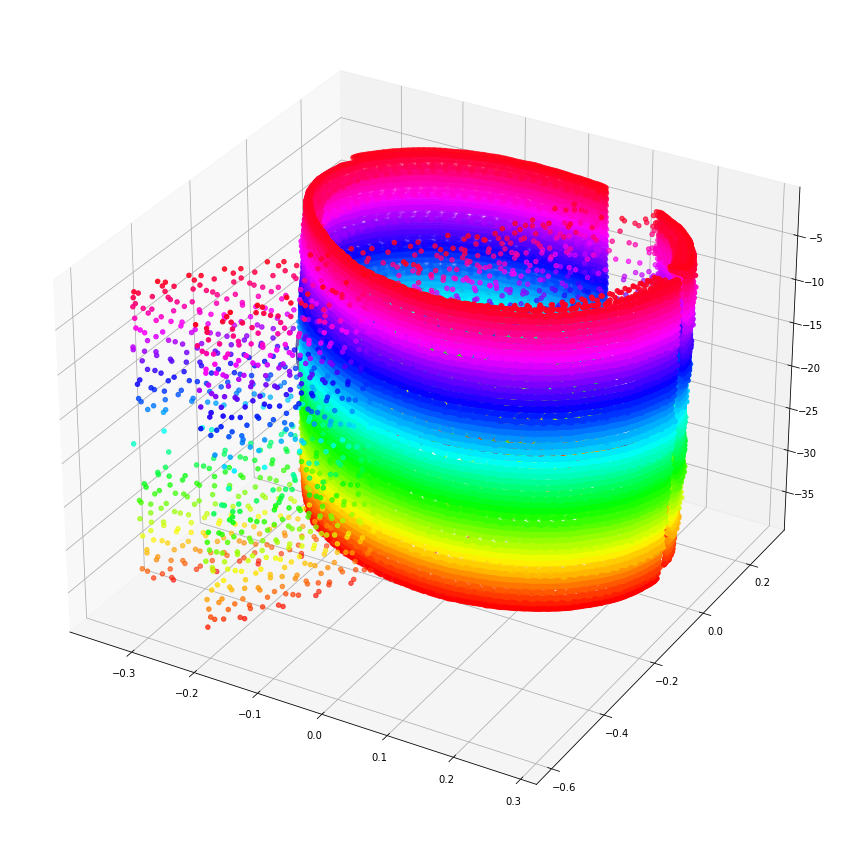

In [55]:
%matplotlib inline
# pixel in inches for figsize
px = 1/plt.rcParams['figure.dpi']

import matplotlib.pyplot as plt
plt.figure(figsize=(1100*px, 1100*px))
ax = plt.axes(projection ='3d')

ax.plot_surface(Xc, Yc, Zc, color="navy", alpha=0.75)
ax.scatter3D(xs, ys, zs, c=zs, cmap='hsv')
plt.show()